In [1]:
import numpy as np
import os
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import contextily as ctx
import ulmo
import datetime as dt
from datetime import datetime
from shapely.geometry import Point
import metloom
from metloom.pointdata import CDECPointData
from metloom.pointdata import SnotelPointData
from metloom.variables import CdecStationVariables
import pickle
import scipy.stats as stats
# SVD function from scipy
from scipy.linalg import svd
import sklearn
from sklearn.cluster import KMeans

In [2]:
wstates = gpd.read_file('../data/misc/western_states.shp')
wstates_4326=wstates.to_crs('epsg:4326')

wstates_boundary = gpd.read_file('../data/misc/western_boundary.geojson')

In [3]:
cdec_anom = pickle.load(open('../data/cdec/cdec_april1_swe_anom.pkl', 'rb'))
cdec_locations = pickle.load(open('../data/cdec/cdec_nan_swe_locations.pkl', 'rb'))

snotel_anom = pickle.load(open('../data/snotel/snotel_april1_swe_anom.pkl', 'rb'))
snotel_locations = pickle.load(open('../data/snotel/western_snotel_swe_nan.pkl','rb'))

## Combine the Snotel and CDEC dataframes:

In [4]:
# snotel_anom.index = pd.to_datetime(snotel_anom.index).date
# cdec_anom.index = pd.to_datetime(cdec_anom.index).date

In [4]:
snotel_anom_sdev = snotel_anom / np.std(snotel_anom, axis=0)
cdec_anom_sdev = cdec_anom / np.std(cdec_anom, axis=0)

In [9]:
cdec_anom.head()

,PLP,UBC,CRL,CSV,CAP,HHM,BLD
1990-04-01 00:00:00+00:00,-23.545882,-13.977941,-11.080294,-5.921176,-11.886176,-9.999706,-11.364118
1991-04-01 00:00:00+00:00,-8.905882,-4.177941,-4.840294,1.918824,-9.966176,-15.639706,-3.884118
1992-04-01 00:00:00+00:00,-16.705882,-6.137941,-7.720294,-3.311176,-13.206176,-7.119706,-10.374118
1993-04-01 00:00:00+00:00,-3.865882,25.242059,11.609706,11.738824,13.323824,28.400294,18.745882
1994-04-01 00:00:00+00:00,-17.665882,-10.047941,-5.930294,-6.561176,-13.556176,-30.769706,-10.174118


In [8]:
snotel_anom.head()

,301_CA_SNTL,302_OR_SNTL,303_CO_SNTL,304_OR_SNTL,306_ID_SNTL,308_AZ_SNTL,309_WY_SNTL,310_AZ_SNTL,311_MT_SNTL,312_ID_SNTL,...,864_UT_SNTL,865_UT_SNTL,866_AZ_SNTL,867_ID_SNTL,868_WY_SNTL,869_CO_SNTL,873_OR_SNTL,874_CO_SNTL,875_WY_SNTL,877_AZ_SNTL
datetime,,,,,,,,,,,,,,,,,,,,,
1990-04-01 00:00:00+00:00,-3.13125,-0.240625,-2.596875,-6.140625,-8.853125,-1.528125,6.80625,-3.15,2.8375,-6.359375,...,0.096875,-4.8875,-0.809375,-4.209375,-6.821875,-1.428125,-5.190625,-10.509375,-3.0,-0.778125
1991-04-01 00:00:00+00:00,-5.13125,-1.440625,0.503125,-2.940625,-8.453125,8.971875,0.80625,9.35,5.6375,-6.759375,...,-1.003125,-2.4875,4.290625,-0.009375,-2.421875,0.171875,-4.390625,7.590625,0.4,9.021875
1992-04-01 00:00:00+00:00,-10.43125,-5.740625,4.803125,-14.840625,-10.553125,7.071875,-3.99375,5.45,-3.7625,-8.259375,...,-1.703125,6.6125,0.490625,-9.509375,-9.121875,-3.228125,-7.890625,-1.709375,-2.0,-0.778125
1993-04-01 00:00:00+00:00,5.96875,2.959375,9.803125,10.359375,4.646875,2.171875,-3.09375,11.15,-4.0625,2.240625,...,9.196875,13.9125,5.890625,2.490625,-0.621875,4.671875,4.509375,12.090625,-2.5,-0.778125
1994-04-01 00:00:00+00:00,-2.13125,0.259375,0.803125,-0.040625,-9.653125,-1.428125,4.40625,-0.95,-3.8625,-8.859375,...,-2.503125,-2.9875,-0.809375,-4.609375,-5.321875,-2.428125,-2.690625,-2.609375,1.4,-0.778125


In [11]:
snotel_anom_sdev.head()

,301_CA_SNTL,302_OR_SNTL,303_CO_SNTL,304_OR_SNTL,306_ID_SNTL,308_AZ_SNTL,309_WY_SNTL,310_AZ_SNTL,311_MT_SNTL,312_ID_SNTL,...,864_UT_SNTL,865_UT_SNTL,866_AZ_SNTL,867_ID_SNTL,868_WY_SNTL,869_CO_SNTL,873_OR_SNTL,874_CO_SNTL,875_WY_SNTL,877_AZ_SNTL
datetime,,,,,,,,,,,,,,,,,,,,,
1990-04-01 00:00:00+00:00,-0.492262,-0.038488,-0.579697,-1.031848,-1.100293,-0.438781,2.114029,-0.671011,0.528503,-0.911020,...,0.020327,-0.856166,-0.392652,-0.837672,-1.063885,-0.451511,-1.068893,-1.158316,-0.798210,-0.321617
1991-04-01 00:00:00+00:00,-0.806681,-0.230428,0.112312,-0.494132,-1.050579,2.576158,0.250422,1.991730,1.050022,-0.968322,...,-0.210487,-0.435747,2.081510,-0.001866,-0.377696,0.054339,-0.904151,0.836619,0.106428,3.728944
1992-04-01 00:00:00+00:00,-1.639892,-0.918215,1.072195,-2.493764,-1.311574,2.030598,-1.240463,1.160955,-0.700791,-1.183206,...,-0.357369,1.158343,0.238017,-1.892381,-1.422574,-1.020592,-1.624897,-0.188403,-0.532140,-0.321617
1993-04-01 00:00:00+00:00,0.938344,0.473353,2.188339,1.740751,0.577527,0.623626,-0.960922,2.375165,-0.756668,0.320983,...,1.929794,2.437118,2.857718,0.495638,-0.096983,1.477043,0.928605,1.332597,-0.665175,-0.321617
1994-04-01 00:00:00+00:00,-0.335053,0.041487,0.179281,-0.006826,-1.199719,-0.410068,1.368586,-0.202368,-0.719416,-1.269160,...,-0.525234,-0.523334,-0.392652,-0.917273,-0.829957,-0.767667,-0.554074,-0.287598,0.372498,-0.321617


In [5]:
combined_april1_anom = pd.merge(snotel_anom, cdec_anom, how='inner', left_index=True, right_index=True)
combined_april1_anom_sdev = pd.merge(snotel_anom_sdev, cdec_anom_sdev, how='inner', left_index=True, right_index=True)

In [6]:
print(snotel_anom.shape)
print(cdec_anom.shape)
print(combined_april1_anom.shape)

(32, 504)
(34, 7)
(32, 511)


In [13]:
combined_april1_anom.tail()

,301_CA_SNTL,302_OR_SNTL,303_CO_SNTL,304_OR_SNTL,306_ID_SNTL,308_AZ_SNTL,309_WY_SNTL,310_AZ_SNTL,311_MT_SNTL,312_ID_SNTL,...,874_CO_SNTL,875_WY_SNTL,877_AZ_SNTL,PLP,UBC,CRL,CSV,CAP,HHM,BLD
2017-04-01 00:00:00+00:00,8.26875,4.359375,2.003125,3.759375,18.446875,-1.528125,0.40625,-3.15,-0.7625,14.140625,...,9.990625,-0.1,-0.778125,36.224118,19.502059,-28.720294,15.738824,26.753824,51.480294,11.795882
2018-04-01 00:00:00+00:00,-4.93125,-5.040625,-4.896875,-4.340625,-2.953125,-1.528125,2.10625,-3.15,1.3375,0.140625,...,-7.009375,10.0,-0.778125,-17.495882,-6.687941,-22.260294,-8.041176,-11.646176,0.760294,-14.244118
2019-04-01 00:00:00+00:00,10.66875,-2.340625,6.703125,2.059375,4.846875,-1.428125,-2.49375,1.15,-2.7625,4.040625,...,16.890625,0.9,-0.778125,48.484118,16.162059,-23.630294,16.628824,33.893824,30.240294,9.635882
2020-04-01 00:00:00+00:00,-3.43125,-5.140625,-2.596875,1.159375,-3.753125,-1.528125,1.60625,-3.15,-1.9625,-3.459375,...,-1.509375,2.3,-0.778125,-4.735882,-16.257941,-1.190294,-7.941176,-6.856176,-17.779706,-10.764118
2021-04-01 00:00:00+00:00,0.26875,-5.940625,2.603125,3.459375,-4.853125,-1.528125,-1.99375,-3.15,-3.6625,-2.359375,...,2.190625,-0.6,-0.778125,-5.025882,-15.137941,-7.580294,-10.971176,-5.716176,-8.869706,-7.164118


In [16]:
snotel_locations

,name,network,location,elevation_m,site_property,longitude,latitude,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry,code
code,,,,,,,,,,,,,,
301_CA_SNTL,Adin Mtn,SNOTEL,"{'latitude': '41.2358283996582', 'longitude': ...",1886.712036,"{'county': 'Modoc', 'state': 'California', 'si...",-120.791924,41.235828,0400000US04,04,Arizona,,113594.084,POINT Z (-120.79192 41.23583 1886.71204),0
302_OR_SNTL,Aneroid Lake #2,SNOTEL,"{'latitude': '45.213279724121094', 'longitude'...",2255.520020,"{'county': 'Wallowa', 'state': 'Oregon', 'site...",-117.192581,45.213280,0400000US04,04,Arizona,,113594.084,POINT Z (-117.19258 45.21328 2255.52002),4
303_CO_SNTL,Apishapa,SNOTEL,"{'latitude': '37.330619812011719', 'longitude'...",3048.000000,"{'county': 'Huerfano', 'state': 'Colorado', 's...",-105.067490,37.330620,0400000US04,04,Arizona,,113594.084,POINT Z (-105.06749 37.33062 3048.00000),6
304_OR_SNTL,Arbuckle Mtn,SNOTEL,"{'latitude': '45.190849304199219', 'longitude'...",1758.696045,"{'county': 'Morrow', 'state': 'Oregon', 'site_...",-119.253922,45.190849,0400000US04,04,Arizona,,113594.084,POINT Z (-119.25392 45.19085 1758.69604),8
306_ID_SNTL,Atlanta Summit,SNOTEL,"{'latitude': '43.756900787353516', 'longitude'...",2310.384033,"{'county': 'Elmore', 'state': 'Idaho', 'site_c...",-115.239067,43.756901,0400000US04,04,Arizona,,113594.084,POINT Z (-115.23907 43.75690 2310.38403),10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
869_CO_SNTL,Willow Creek Pass,SNOTEL,"{'latitude': '40.347030639648438', 'longitude'...",2907.791992,"{'county': 'Grand', 'state': 'Colorado', 'site...",-106.094330,40.347031,0400000US04,04,Arizona,,113594.084,POINT Z (-106.09433 40.34703 2907.79199),843
873_OR_SNTL,Wolf Creek,SNOTEL,"{'latitude': '45.067031860351563', 'longitude'...",1716.024048,"{'county': 'Union', 'state': 'Oregon', 'site_c...",-118.151917,45.067032,0400000US04,04,Arizona,,113594.084,POINT Z (-118.15192 45.06703 1716.02405),847
874_CO_SNTL,Wolf Creek Summit,SNOTEL,"{'latitude': '37.479221343994141', 'longitude'...",3352.800049,"{'county': 'Mineral', 'state': 'Colorado', 'si...",-106.801697,37.479221,0400000US04,04,Arizona,,113594.084,POINT Z (-106.80170 37.47922 3352.80005),848


In [7]:
# Reformat station geodataframes so I can combine them:

snotel_locations = snotel_locations.drop(columns={'site_property', 'code', 'GEO_ID', 'STATE', 'NAME', 'LSAD', 'CENSUSAREA','location','longitude','latitude'})
cdec_locations = cdec_locations.rename(columns={'id':'code','datasource':'network'})
cdec_locations['elevation_m'] = cdec_locations.geometry.z * 0.3048
cdec_locations = cdec_locations.set_index('code')
cdec_locations = cdec_locations.set_crs('epsg:4326')

In [8]:
station_locations = pd.concat([snotel_locations, cdec_locations])

In [24]:
station_locations

,name,network,elevation_m,geometry
code,,,,
301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,POINT Z (-120.79192 41.23583 1886.71204)
302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,POINT Z (-117.19258 45.21328 2255.52002)
303_CO_SNTL,Apishapa,SNOTEL,3048.000000,POINT Z (-105.06749 37.33062 3048.00000)
304_OR_SNTL,Arbuckle Mtn,SNOTEL,1758.696045,POINT Z (-119.25392 45.19085 1758.69604)
306_ID_SNTL,Atlanta Summit,SNOTEL,2310.384033,POINT Z (-115.23907 43.75690 2310.38403)
...,...,...,...,...
CRL,CHARLOTTE LAKE,CDEC,3169.920000,POINT Z (-118.42601 36.77752 10400.00000)
CSV,CASA VIEJA MEADOWS,CDEC,2529.840000,POINT Z (-118.26769 36.19810 8300.00000)
CAP,CAPLES LAKE,CDEC,2438.400000,POINT Z (-120.04158 38.71079 8000.00000)


## Perform SVD analysis:

In [9]:
# Convert to an array for use in the svd function
snotel_anom_array = snotel_anom.to_numpy()
combined_anom_array = combined_april1_anom.to_numpy()
combined_anom_sdev_array = combined_april1_anom_sdev.to_numpy()

In [87]:
combined_april1_anom_sdev.describe()

,301_CA_SNTL,356_CA_SNTL,1051_CA_SNTL,1067_CA_SNTL,977_CA_SNTL,462_CA_SNTL,463_CA_SNTL,473_CA_SNTL,1049_CA_SNTL,508_CA_SNTL,...,849_NV_SNTL,DAN,HOR,INN,TK2,MRL,RCK,BLK,IDC,SDW
count,19.000000,19.000000,19.000000,1.900000e+01,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,...,19.000000,1.900000e+01,1.900000e+01,19.000000,1.900000e+01,1.900000e+01,1.900000e+01,1.900000e+01,1.900000e+01,1.900000e+01
mean,0.050947,0.056167,0.023379,-2.337312e-17,0.099124,0.087104,0.049820,0.136008,0.015955,0.081110,...,0.070277,-2.337312e-17,-1.168656e-16,0.000000,8.180591e-17,-9.349247e-17,-5.843279e-17,1.168656e-16,-1.051790e-16,4.674623e-17
std,1.027402,1.027402,1.027402,1.027402e+00,1.027402,1.027402,1.027402,1.027402,1.027402,1.027402,...,1.027402,1.027402e+00,1.027402e+00,1.027402,1.027402e+00,1.027402e+00,1.027402e+00,1.027402e+00,1.027402e+00,1.027402e+00
min,-1.558245,-1.861863,-1.709582,-1.786212e+00,-0.376670,-1.776370,-1.854332,-0.646037,-1.877598,-1.254968,...,-1.538118,-1.679882e+00,-1.628690e+00,-1.328866,-1.569430e+00,-1.668668e+00,-9.639584e-01,-1.918827e+00,-1.226017e+00,-1.481557e+00
25%,-0.761415,-0.527906,-0.549650,-6.444452e-01,-0.376670,-0.436080,-0.495926,-0.646037,-0.596883,-0.589555,...,-0.722316,-7.144832e-01,-4.961931e-01,-0.693114,-6.600780e-01,-7.239324e-01,-7.812934e-01,-5.801453e-01,-5.688102e-01,-7.277707e-01
50%,0.035415,-0.187322,-0.259667,-2.901040e-01,-0.376670,-0.257375,-0.292165,-0.328540,-0.373640,-0.157037,...,-0.127001,-2.496614e-01,-3.638233e-01,-0.102772,-1.675122e-01,-2.275457e-01,-5.012071e-01,-2.383543e-01,-3.497414e-01,-4.188421e-01
75%,0.655171,0.990534,0.834361,9.172811e-01,-0.171214,0.881872,1.009641,0.465202,0.883575,0.857717,...,0.821094,7.514933e-01,9.010432e-01,0.623802,6.281709e-01,8.613026e-01,5.338945e-01,9.009492e-01,3.074650e-01,9.280866e-01
max,2.337367,2.565738,2.244733,2.019676e+00,2.910633,2.445544,2.220887,3.163924,2.211288,2.471342,...,2.121968,2.324736e+00,2.283572e+00,2.167773,1.954310e+00,2.110276e+00,2.762407e+00,2.524457e+00,2.863268e+00,2.275015e+00


In [10]:
# Perform the SVD

# Repeat the snotel analysis for comparison
Us, Ss, Vs = svd(snotel_anom_array.T,full_matrices=False)

# do the analysis on the combined snotel and cdec data
Uc, Sc, Vc = svd(combined_anom_array.T,full_matrices=False)

# do the analysis on the combined snotel and cdec data divided by the stdev
Usd, Ssd, Vsd = svd(combined_anom_sdev_array.T,full_matrices=False)

In [27]:
Uc.shape

(511, 32)

In [11]:
# SVD Variance Explained, divide S values by the sum of all S
var_exp = Ssd / np.sum(Ssd)

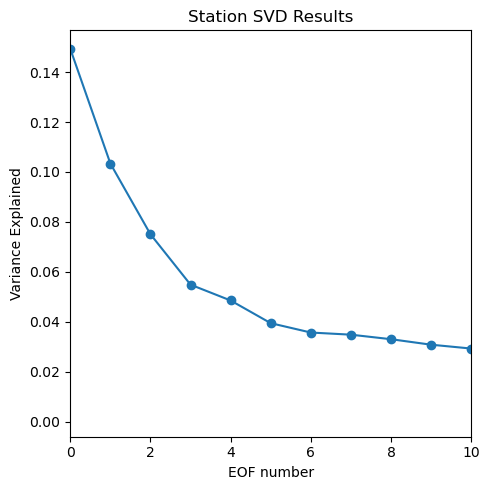

In [12]:
plt.figure(figsize=(5,5))
plt.plot(var_exp,'-o')
plt.xlabel('EOF number')
plt.ylabel('Variance Explained')
#plt.title('SVD Variance Explained')
#plt.ylim([0,0.16])
plt.xlim([0,10])
plt.title('Station SVD Results')
plt.tight_layout()
plt.savefig('../figures/91823/station_eof_varianceexplained.jpeg');

#### The first five EOFs explain most of the variance:

In [13]:
# the first 10:
#print(var_exp[0:10])

# sum of the first 10
print('Percent of overall variance explained by \nthe top 10 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:10]),1)), '\nthe top 5 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:5]),1)))

Percent of overall variance explained by 
the top 10 patterns = 60.5% 
the top 5 patterns = 43.1%


In [57]:
# the first 10:
print(var_exp[0:4])

# sum of the first 10
print('Percent of overall variance explained by the top 4 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:4]),1)))

[0.21080654 0.13361996 0.08408008 0.06746186]
Percent of overall variance expplained by the top 4 patterns = 49.6%


### Plot the results of the Combined (Snotel and CDEC) next to just the Snotel:

In [14]:
wstates = wstates.to_crs('epsg:4326')

Text(510.3244949494949, 0.5, 'weight')

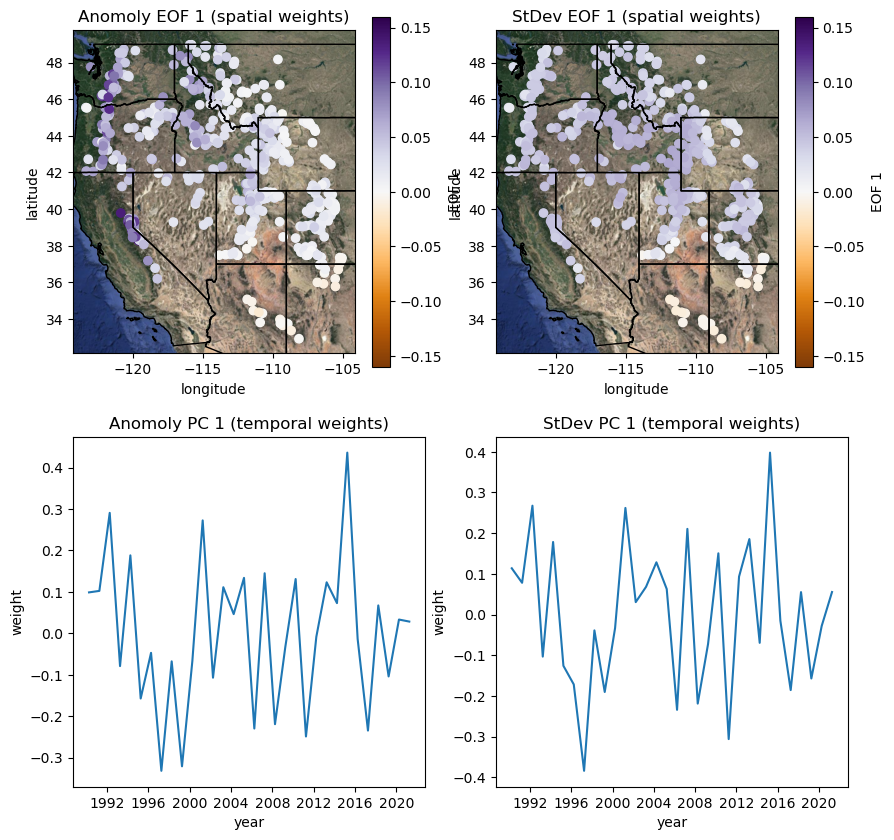

In [23]:
# first index for both U and V
i = 0
#station_locations[f'U{i}'] = Uc[:,i]

# plot first EOF (U)
fig, ax = plt.subplots(2,2, figsize=(10,10))
station_locations.plot(ax=ax[0,0], column=-1*Uc[:,i], legend=True, cmap='PuOr', legend_kwds={'label': "EOF 1",'orientation': "vertical"}, vmin=-0.16, vmax=0.16)
ctx.add_basemap(ax=ax[0,0], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False)
#ctx.add_basemap(ax=ax[0,0], crs='epsg:4326', source=ctx.providers.Esri.WorldTerrain)
wstates.plot(ax=ax[0,0], facecolor='none', edgecolor='k')
ax[0,0].set_title('Anomoly EOF 1 (spatial weights)');
ax[0,0].set_xlabel('longitude')
ax[0,0].set_ylabel('latitude')

#Plot first PC (V)
#plt.figure(figsize=(10,3))
ax[1,0].plot(combined_april1_anom.index,Vc[i,:]);
ax[1,0].set_title('Anomoly PC 1 (temporal weights)');
ax[1,0].set_xlabel('year')
ax[1,0].set_ylabel('weight')

# plot first EOF (U)
#snotel_locations[f'U{i}'] = Us[:,i]

station_locations.plot(ax=ax[0,1], column=-1*Usd[:,i], legend=True, cmap='PuOr', legend_kwds={'label': "EOF 1",'orientation': "vertical"}, vmin=-0.16, vmax=0.16)
#ctx.add_basemap(ax=ax[0,1], crs='epsg:4326', source=ctx.providers.Stamen.Terrain)
ctx.add_basemap(ax=ax[0,1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False)
wstates.plot(ax=ax[0,1], facecolor='none', edgecolor='k')
ax[0,1].set_title('StDev EOF 1 (spatial weights)');
ax[0,1].set_xlabel('longitude')
ax[0,1].set_ylabel('latitude')

#Plot first PC (V)
#plt.figure(figsize=(10,3))
ax[1,1].plot(combined_april1_anom.index,Vsd[i,:]);
ax[1,1].set_title('StDev PC 1 (temporal weights)');
ax[1,1].set_xlabel('year')
ax[1,1].set_ylabel('weight')

### Zoom into the Central Sierra:

(36.0, 40.0)

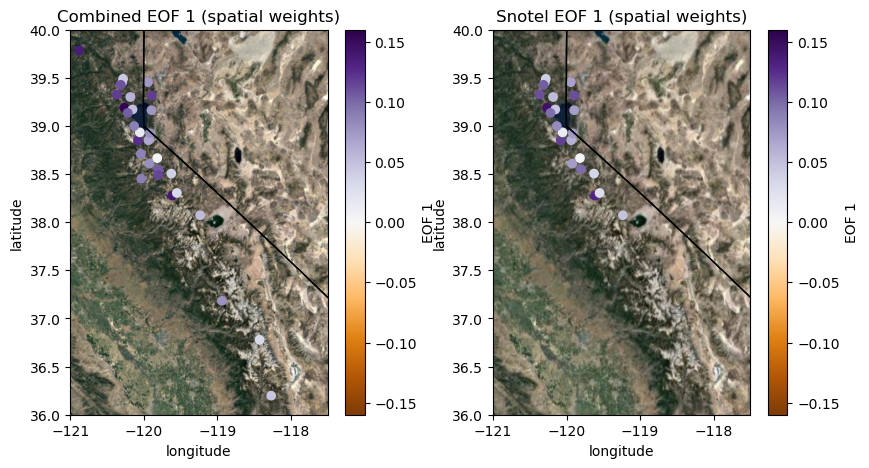

In [29]:
i = 0
#station_locations[f'U{i}'] = Uc[:,i]
# plot first EOF (U)
fig, ax = plt.subplots(1,2,figsize=(10,5))

station_locations.plot(ax=ax[0], column=-1*Uc[:,i], legend=True, cmap='PuOr', legend_kwds={'label': "EOF 1",'orientation': "vertical"}, vmin=-0.16, vmax=0.16)
ctx.add_basemap(ax=ax[0], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False, zoom = 8)
#ctx.add_basemap(ax=ax[0], crs='epsg:4326', source=ctx.providers.Stamen.Terrain)
wstates.plot(ax=ax[0], facecolor='none', edgecolor='k')
ax[0].set_title('Combined EOF 1 (spatial weights)');
ax[0].set_xlabel('longitude')
ax[0].set_ylabel('latitude')
ax[0].set_xlim(-121,-117.5)
ax[0].set_ylim(36,40)

snotel_locations.plot(ax=ax[1], column=-1*Us[:,i], legend=True, cmap='PuOr', legend_kwds={'label': "EOF 1",'orientation': "vertical"}, vmin=-0.16, vmax=0.16)
#ctx.add_basemap(ax=ax[1], crs='epsg:4326', source=ctx.providers.Stamen.Terrain)
ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False, zoom=7)
wstates.plot(ax=ax[1], facecolor='none', edgecolor='k')
ax[1].set_title('Snotel EOF 1 (spatial weights)');
ax[1].set_xlabel('longitude')
ax[1].set_ylabel('latitude')
ax[1].set_xlim(-121,-117.5)
ax[1].set_ylim(36,40)

Looks like the stations are plotting in different orders, so they're hard to compare due to spatial overlap. Plot using hexbins to eliminate this issue:

Text(0.5, 1.0, 'Snotel EOF 1 (spatial weights)')

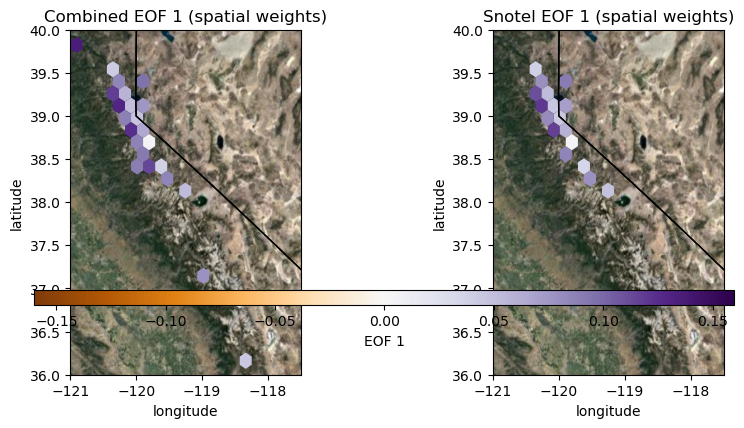

In [31]:
i = 0
#station_locations[f'U{i}'] = Uc[:,i]
# plot first EOF (U)
fig, ax = plt.subplots(1,2,figsize=(10,5))

# station_locations.plot(ax=ax[0], column=-1*Uc[:,i], legend=True, cmap='PuOr', legend_kwds={'label': "EOF 1",'orientation': "vertical"}, vmin=-0.16, vmax=0.16)

combined = ax[0].hexbin(station_locations.geometry.x, 
               station_locations.geometry.y, 
               C=-1*Uc[:,i], 
               reduce_C_function=np.median, gridsize=100, cmap = 'PuOr', 
               mincnt=0.0001, vmin=-0.16, vmax=0.16, edgecolors='none')
ctx.add_basemap(ax=ax[0], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False, zoom=7)
#ctx.add_basemap(ax=ax[0], crs='epsg:4326', source=ctx.providers.Stamen.Terrain)
wstates.plot(ax=ax[0], facecolor='none', edgecolor='k')

ax[0].set_xlabel('longitude')
ax[0].set_ylabel('latitude')
ax[0].set_xlim(-121,-117.5)
ax[0].set_ylim(36,40)

# snotel_locations.plot(ax=ax[1], column=-1*Us[:,i], legend=True, cmap='PuOr', legend_kwds={'label': "EOF 1",'orientation': "vertical"}, vmin=-0.16, vmax=0.16)

snotel_only = ax[1].hexbin(snotel_locations.geometry.x, 
               snotel_locations.geometry.y, 
               C=-1*Us[:,i], 
               reduce_C_function=np.median, gridsize=100, cmap = 'PuOr', 
               mincnt=0.0001, vmin=-0.16, vmax=0.16, edgecolors='none')
ctx.add_basemap(ax=ax[1], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False, zoom=7)
#ctx.add_basemap(ax=ax[1], crs='epsg:4326', source=ctx.providers.Stamen.Terrain)
wstates.plot(ax=ax[1], facecolor='none', edgecolor='k')

ax[1].set_xlabel('longitude')
ax[1].set_ylabel('latitude')
ax[1].set_xlim(-121,-117.5)
ax[1].set_ylim(36,40)

fig.subplots_adjust(top=0.8)
cbar_ax = fig.add_axes([0.15, 0.25, 0.7, 0.03])
plt.colorbar(combined, cax=cbar_ax, label='EOF 1', orientation='horizontal')


ax[0].set_title('Combined EOF 1 (spatial weights)')
ax[1].set_title('Snotel EOF 1 (spatial weights)')

### Plot the first four spatial and temporal weights:

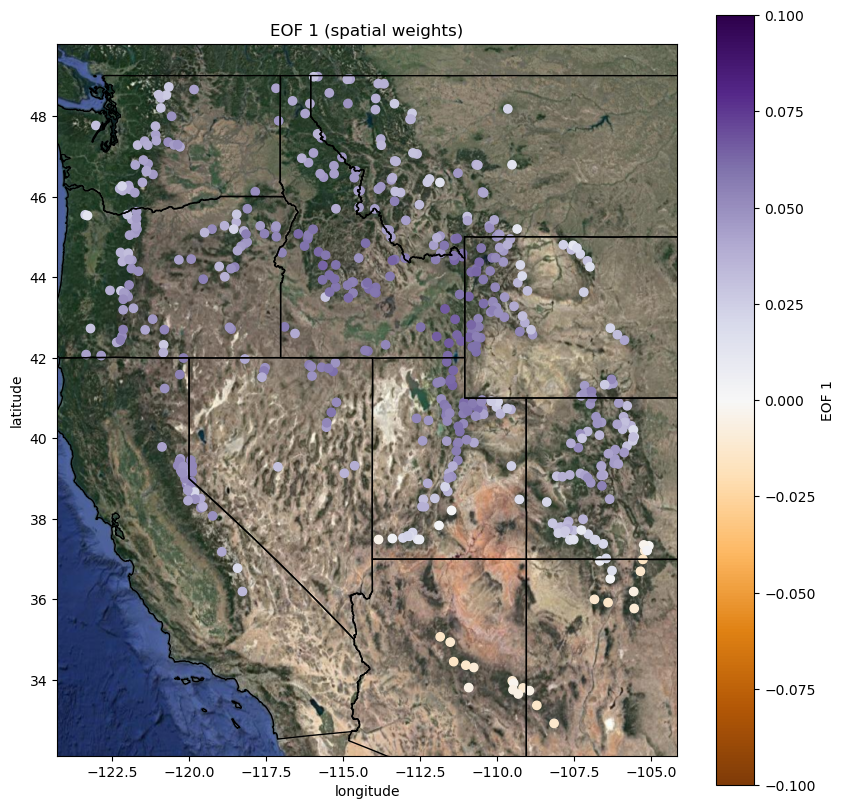

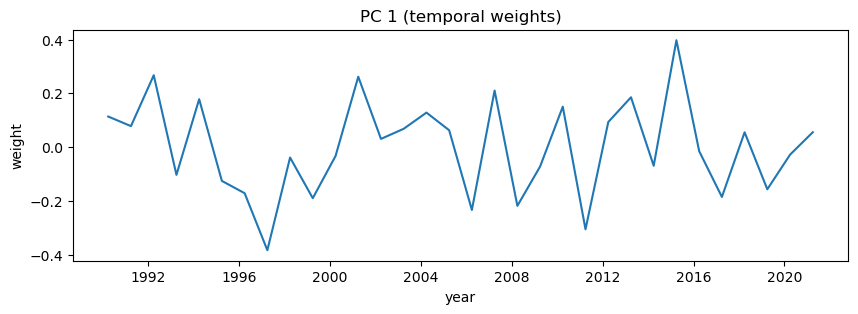

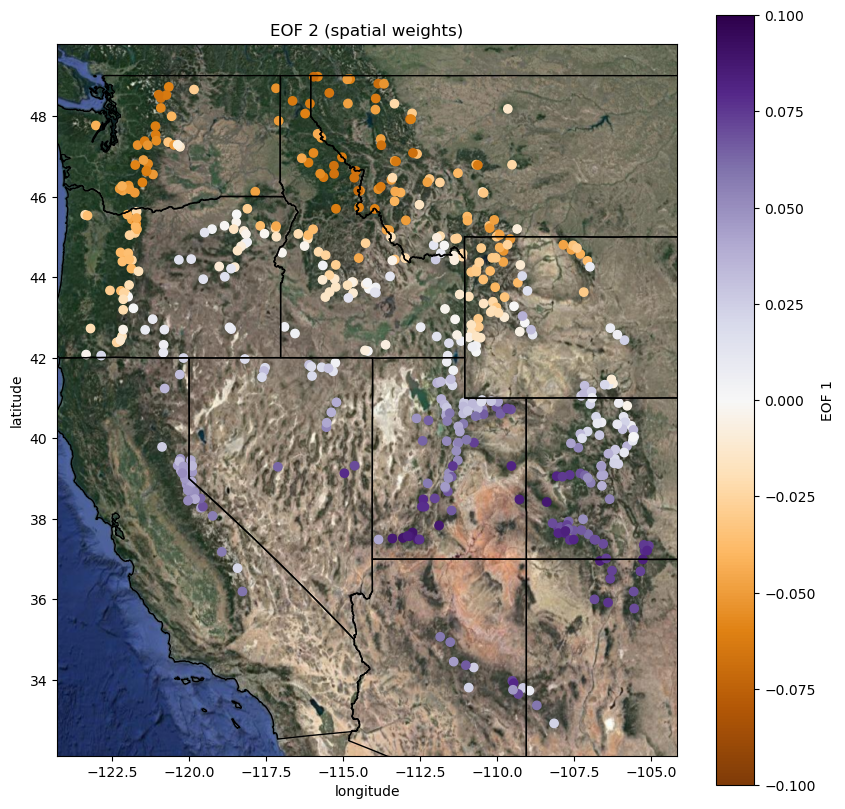

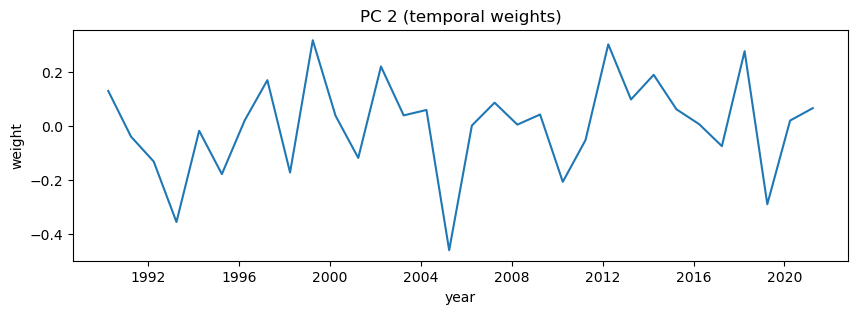

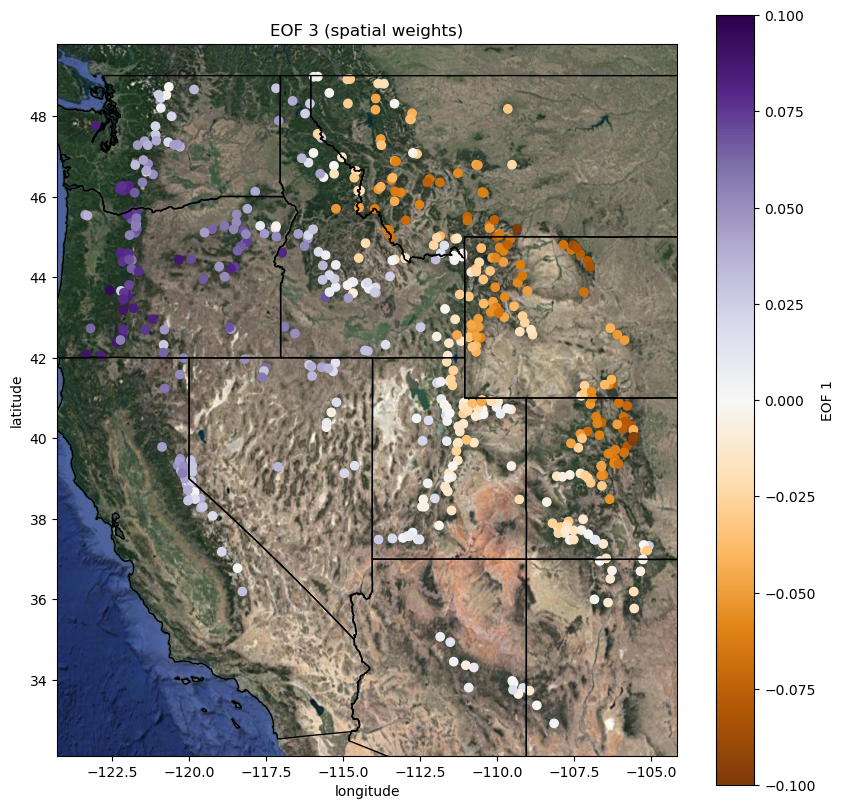

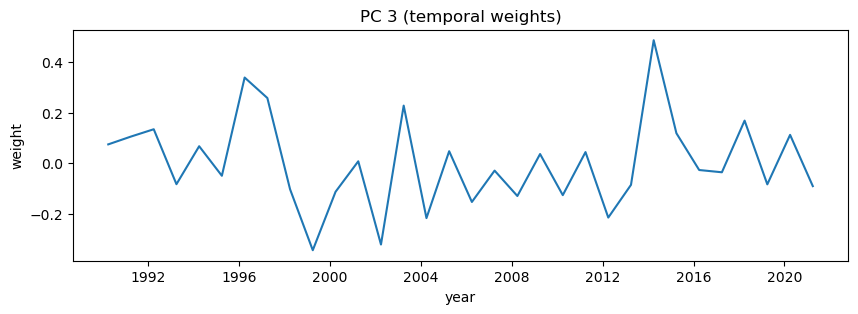

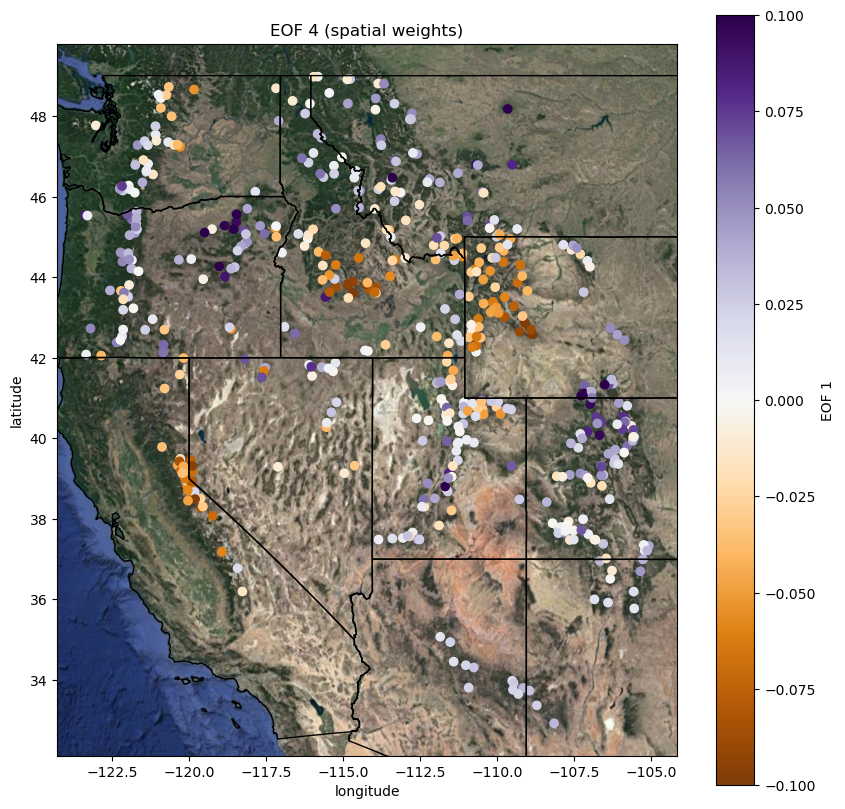

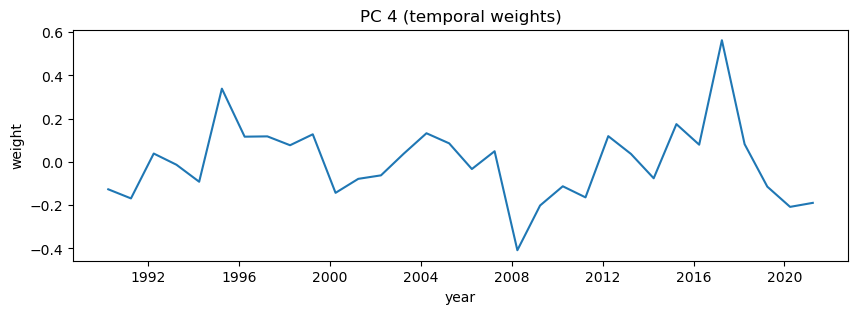

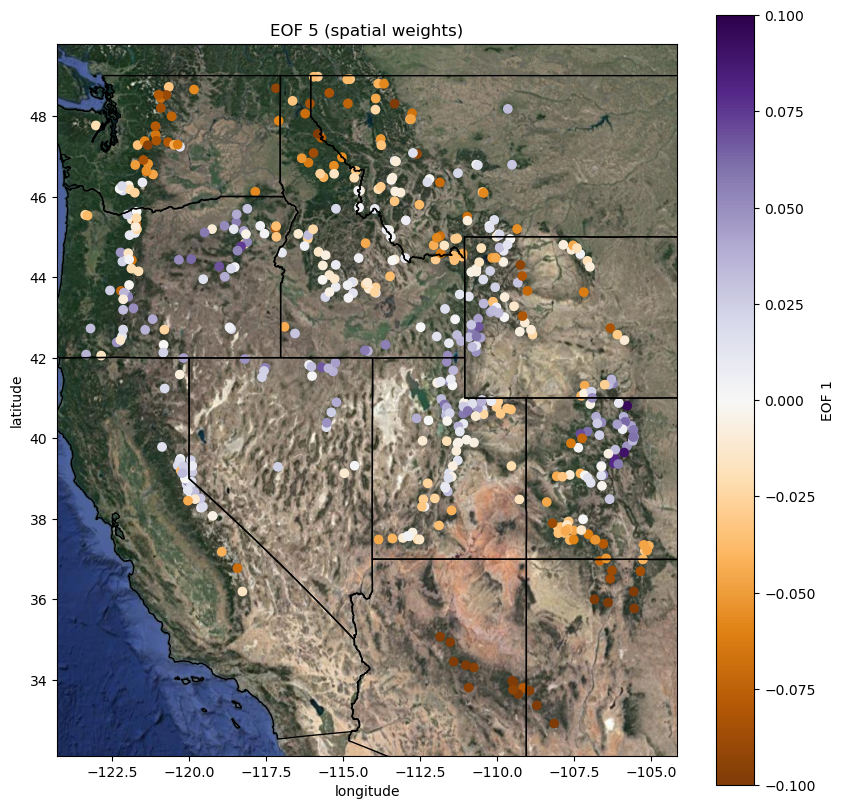

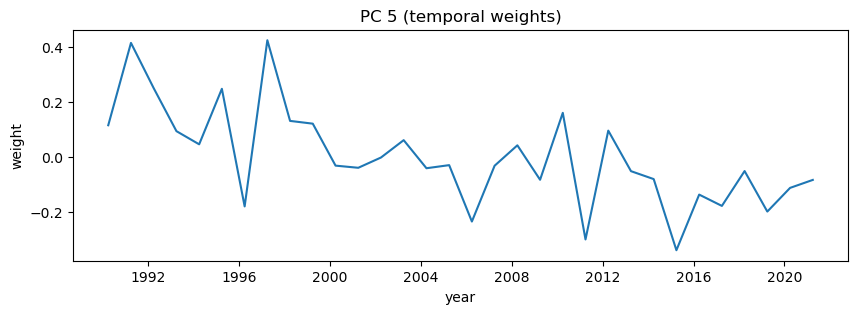

In [33]:
# first four indexes for both U and V

for i in range(5):

    #station_locations[f'U{i}'] = Uc[:,i]
    # plot first EOF (U)
    fig, ax = plt.subplots(figsize=(10,10))
    station_locations.plot(ax=ax, column=-1*Usd[:,i], legend=True, cmap='PuOr', legend_kwds={'label': "EOF 1",'orientation': "vertical"}, vmin=-0.1, vmax=0.1)
    ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False)
    #ctx.add_basemap(ax=ax, crs='epsg:4326', source=ctx.providers.Stamen.Terrain)
    wstates.plot(ax=ax, facecolor='none', edgecolor='k')
    plt.title(f'EOF {i+1} (spatial weights)');
    plt.xlabel('longitude')
    plt.ylabel('latitude')
    
    #Plot first PC (V)
    plt.figure(figsize=(10,3))
    plt.plot(combined_april1_anom.index,Vsd[i,:]);
    plt.title(f'PC {i+1} (temporal weights)');
    plt.xlabel('year')
    plt.ylabel('weight')

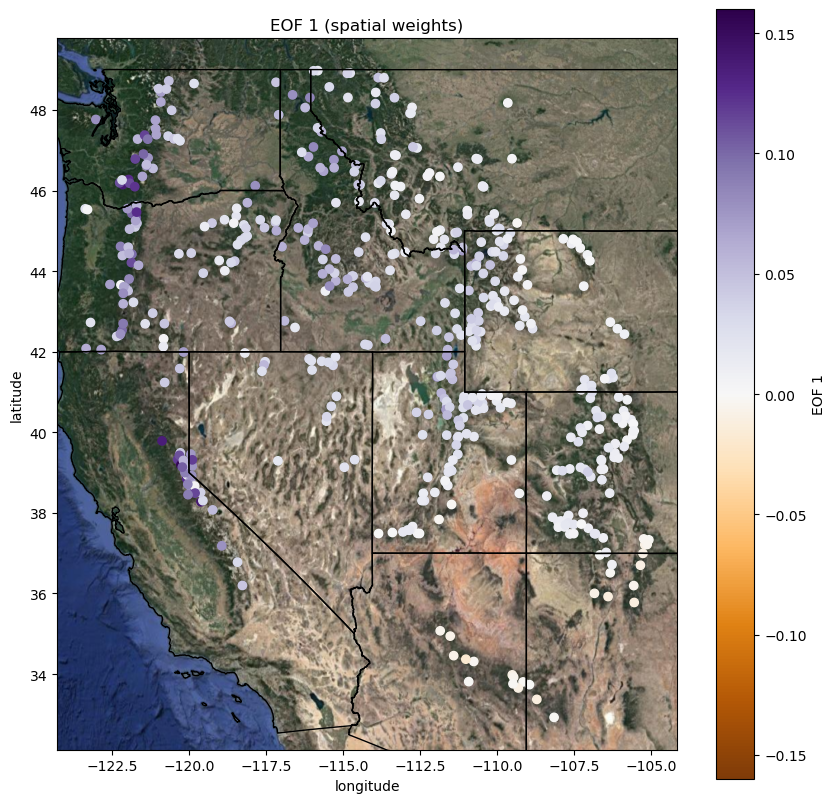

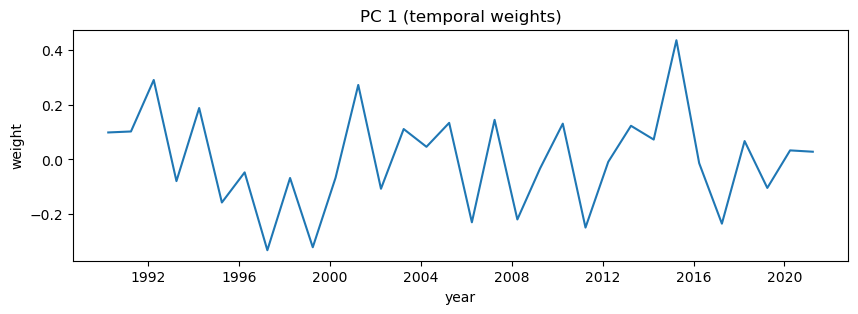

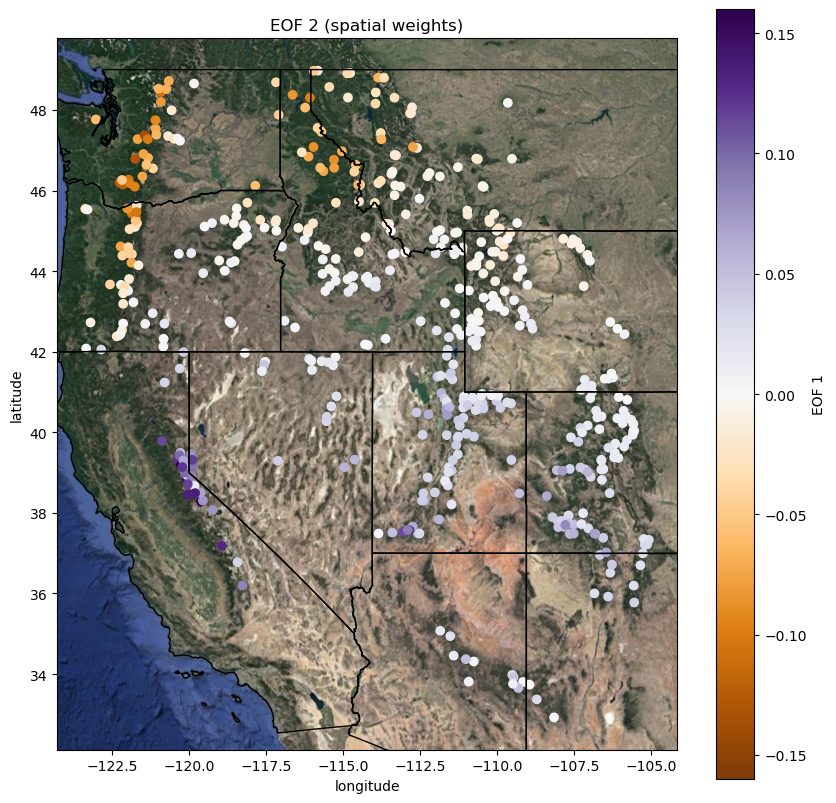

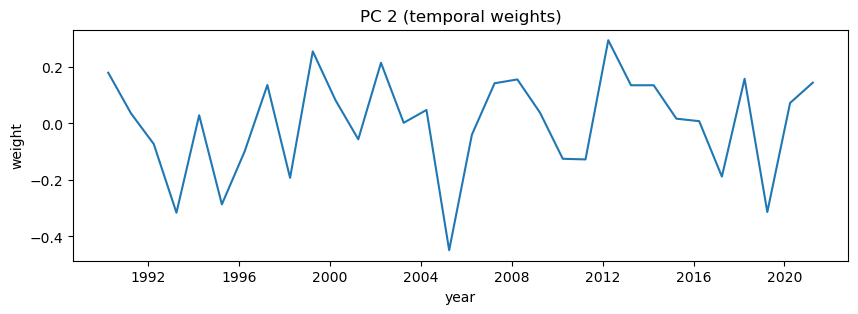

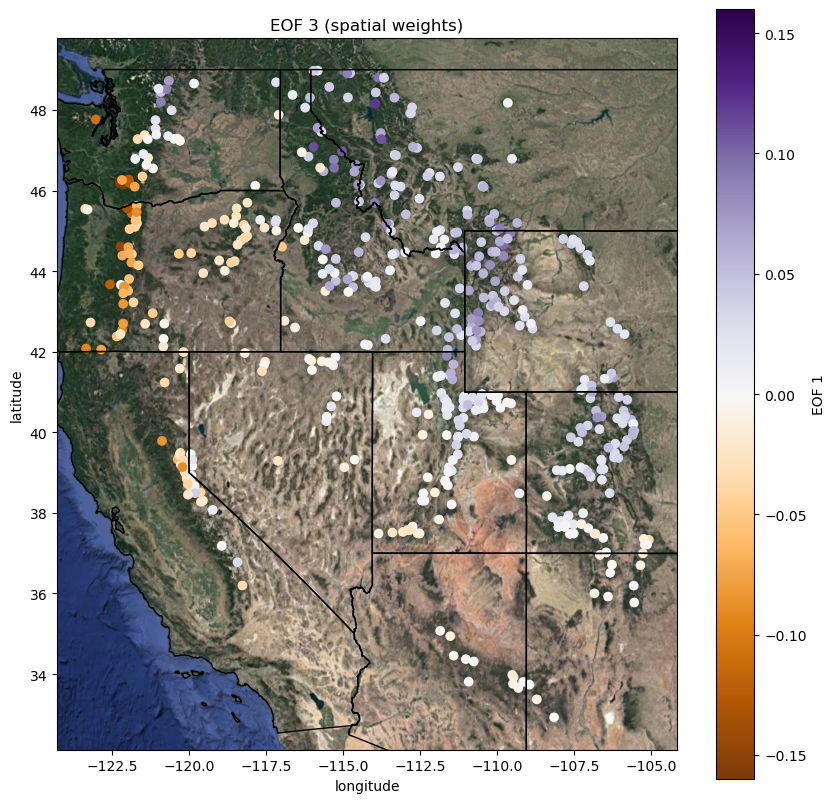

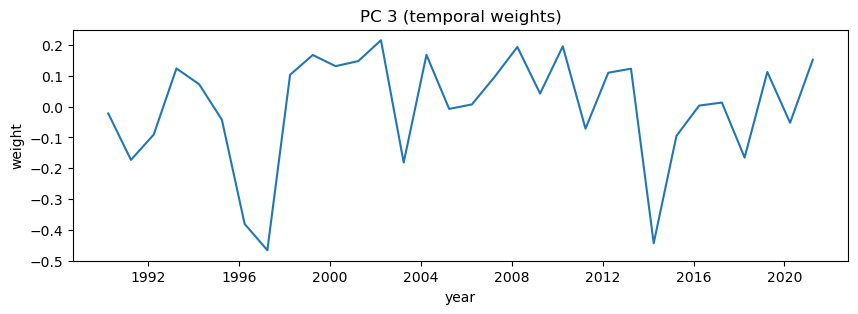

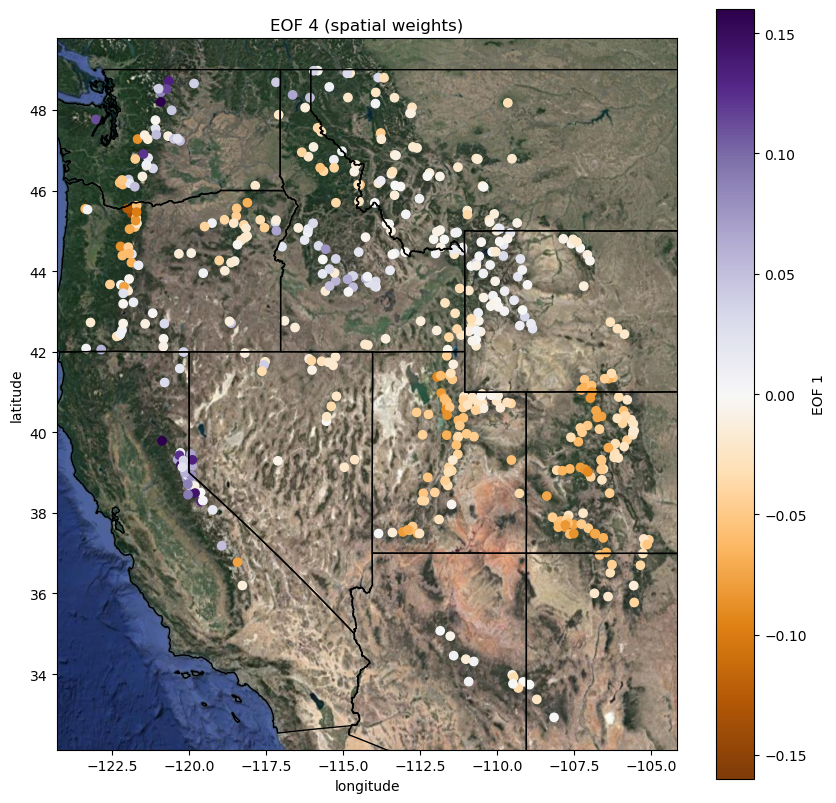

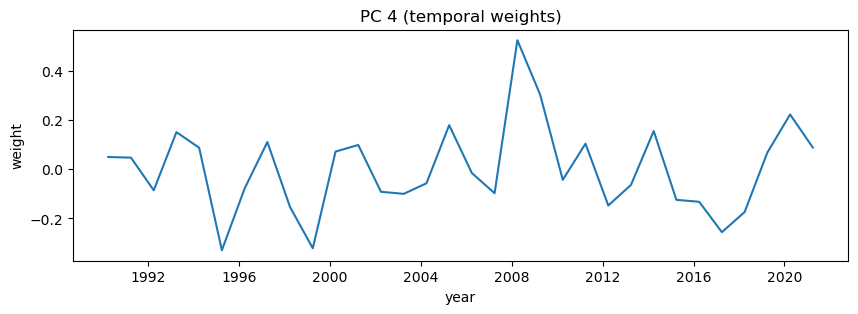

In [34]:
# first four indexes for both U and V

for i in range(4):

    #station_locations[f'U{i}'] = Uc[:,i]
    # plot first EOF (U)
    fig, ax = plt.subplots(figsize=(10,10))
    station_locations.plot(ax=ax, column=-1*Uc[:,i], legend=True, cmap='PuOr', legend_kwds={'label': "EOF 1",'orientation': "vertical"}, vmin=-0.16, vmax=0.16)
    ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False)
    #ctx.add_basemap(ax=ax, crs='epsg:4326', source=ctx.providers.Stamen.Terrain)
    wstates.plot(ax=ax, facecolor='none', edgecolor='k')
    plt.title(f'EOF {i+1} (spatial weights)');
    plt.xlabel('longitude')
    plt.ylabel('latitude')
    
    #Plot first PC (V)
    plt.figure(figsize=(10,3))
    plt.plot(combined_april1_anom_sdev.index,Vc[i,:]);
    plt.title(f'PC {i+1} (temporal weights)');
    plt.xlabel('year')
    plt.ylabel('weight')

## Run the EOF analysis only over Colorado

In [35]:
colorado = wstates[wstates['NAME'] == 'Colorado'].to_crs('epsg:4326')

In [63]:
station_locations_co = gpd.clip(station_locations, colorado)

# Remove Western snotel site locations
combined_april1_anom_co = combined_april1_anom_sdev.copy()

In [64]:
index_list = station_locations_co.index.to_list()
x_list = combined_april1_anom_co.columns.to_list()

for i in x_list:
    if i not in index_list:
        combined_april1_anom_co = combined_april1_anom_co.drop([i], axis=1)

In [43]:
combined_april1_anom_co.shape

(32, 67)

In [44]:
combined_april1_anom_co.tail()

,303_CO_SNTL,322_CO_SNTL,327_CO_SNTL,335_CO_SNTL,345_CO_SNTL,369_CO_SNTL,378_CO_SNTL,380_CO_SNTL,386_CO_SNTL,408_CO_SNTL,...,829_CO_SNTL,838_CO_SNTL,839_CO_SNTL,840_CO_SNTL,842_CO_SNTL,843_CO_SNTL,857_CO_SNTL,859_WY_SNTL,869_CO_SNTL,874_CO_SNTL
2017-04-01 00:00:00+00:00,0.447155,1.161441,0.697821,-0.360217,0.830488,1.011889,-1.339940,1.544894,0.177695,-0.737559,...,1.626757,0.838610,0.228533,0.937203,-0.148681,0.119241,0.401115,-0.322690,1.350580,1.101140
2018-04-01 00:00:00+00:00,-1.093123,-1.247474,-1.130641,-0.853487,-0.994760,-0.842206,-1.042810,-1.169447,-1.417026,-0.182034,...,-1.777289,-0.393508,-1.311058,-1.264998,-1.151283,-1.318775,-1.701068,-0.545440,0.085955,-0.772555
2019-04-01 00:00:00+00:00,1.496330,0.542006,1.921595,0.652285,1.396314,1.574739,0.648542,1.122169,2.432855,0.929016,...,1.401961,0.271836,2.389882,1.169014,0.325276,1.315215,1.637693,0.552401,1.034424,1.861640
2020-04-01 00:00:00+00:00,-0.579697,0.771426,0.251504,1.041708,-0.556701,1.011889,-0.265702,-0.101510,0.419319,1.103610,...,0.599120,0.419690,1.294404,-0.173556,0.033610,0.517899,0.104336,0.886526,0.180802,-0.166359
2021-04-01 00:00:00+00:00,0.581092,0.174933,-0.137225,-0.022716,-0.629710,0.051733,-0.539976,-0.657727,0.032720,-0.213778,...,1.177166,-0.196369,0.524608,0.154842,-0.732013,-0.165514,0.821552,0.090990,-0.388279,0.241445


In [16]:
#combined_april1_anom_co_years = combined_april1_anom_co[:-2]

In [65]:
# for comparison

combined_april1_anom_co_array = combined_april1_anom_co.to_numpy()

In [66]:
# combined_april1_anom_co_array = combined_april1_anom_co.to_numpy()

Uco, Sco, Vco = svd(combined_april1_anom_co_array.T,full_matrices=False)

In [67]:
var_exp = Sco / np.sum(Sco)

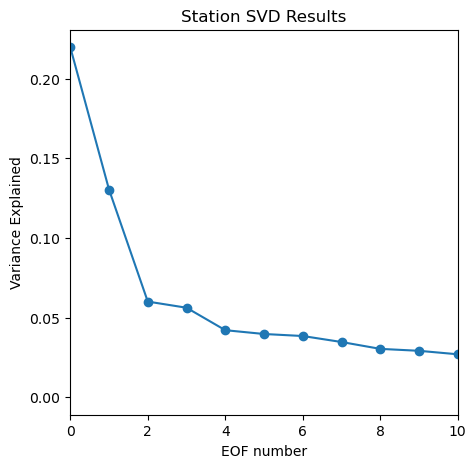

In [68]:
plt.figure(figsize=(5,5))
plt.plot(var_exp,'-o')
plt.xlim(0,10)
plt.xlabel('EOF number')
plt.ylabel('Variance Explained')
plt.title('Station SVD Results')
plt.savefig('../figures/91823/station_eof_varianceexplained.jpeg')

In [69]:
print('Percent of overall variance explained by \nthe top 10 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:10]),1)), '\nthe top 5 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:5]),1)))

Percent of overall variance explained by 
the top 10 patterns = 68.1% 
the top 5 patterns = 50.9%


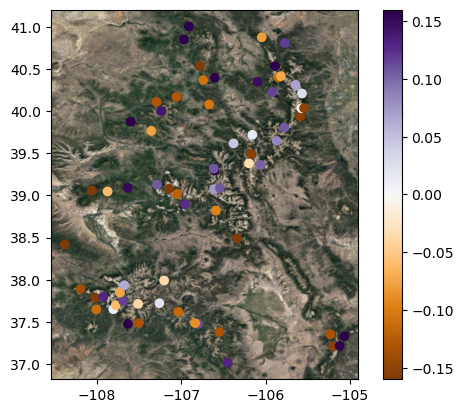

In [70]:
f, ax = plt.subplots()
i = 1
station_locations_co.plot(ax=ax, column=-1*Uco[:,i], legend=True, cmap='PuOr', vmin=-0.16, vmax=0.16)
ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False)

In [140]:
Uco.shape

(66, 19)

In [123]:
colorado.bounds

,minx,miny,maxx,maxy
2,-109.060253,36.992426,-102.041524,41.003444


In [125]:
colorado.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [143]:
type(Uco)

numpy.ndarray

In [146]:
# station_locations_co.to_pickle('../data/station_locations_co.pkl')
# combined_april1_anom_co.to_pickle('../data/combined_april1_anom_co.pkl')

### EOF results, run for just CO:

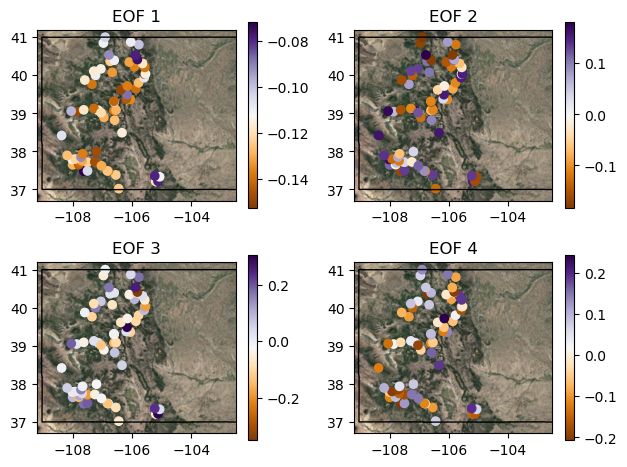

In [71]:
f, ax = plt.subplots(2,2)
i = 0
for row in range(2):
    for column in range(2):     
        station_locations_co.plot(ax=ax[row,column], column=Uco[:,i], legend=True, cmap='PuOr')

        ax[row,column].set_xlim(-109.2,-102.5)
        ax[row,column].set_ylim(36.7,41.2)
        ctx.add_basemap(ax=ax[row,column], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False)
        #ctx.add_basemap(ax=ax[row,column], crs='epsg:4326', source=ctx.providers.Stamen.Terrain, attribution=False)
        colorado.plot(ax=ax[row,column], facecolor='none', edgecolor='k')
        ax[row,column].set_title('EOF {}'.format(i+1))
        # ax[row,column].set_xlabel('Longitude')
        # ax[row,column].set_ylabel('Latitude')
        i+=1
plt.tight_layout()
#plt.savefig('../figures/91823/station_eof_plots.jpeg')

### EOF results, run for the entire Western US:  
Just zoomed into Colorado

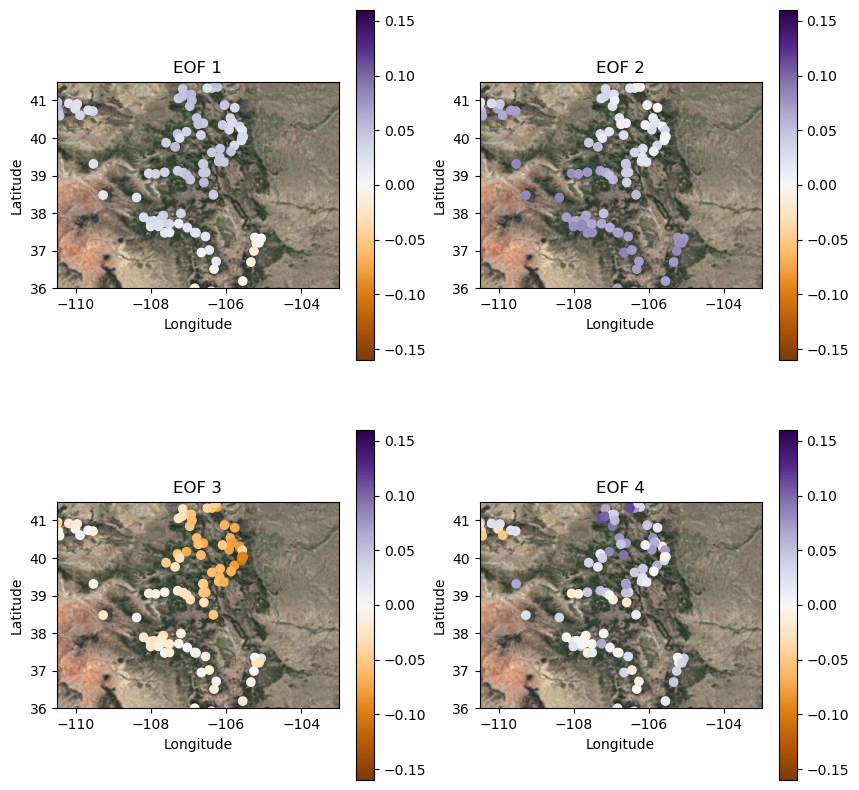

In [78]:
f, ax = plt.subplots(2,2,figsize=(10,10))
i = 0
for row in range(2):
    for column in range(2):     
        station_locations.plot(ax=ax[row,column], column=-1*Usd[:,i], legend=True, cmap='PuOr', vmin=-0.16, vmax=0.16)
        ctx.add_basemap(ax=ax[row,column], crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', attribution=False)
        ax[row,column].set_xlim(-110.5,-103)
        ax[row,column].set_ylim(36,41.5)
        ax[row,column].set_title('EOF {}'.format(i+1))
        ax[row,column].set_xlabel('Longitude')
        ax[row,column].set_ylabel('Latitude')
        i+=1

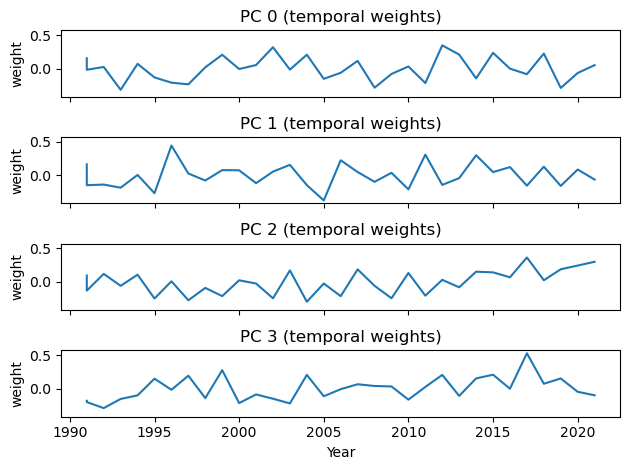

In [74]:
#Plot first PC (V)
f, ax = plt.subplots(4,1, sharex=True, sharey=True)
i=0
for row in range(4): 
    ax[row].plot(np.linspace(1991, 2021, num=32, dtype=int),Vco[i,:])
    #ax[row].set_xlabel('Year')
    ax[row].set_ylabel('weight')
    ax[row].set_title(f'PC {i} (temporal weights)')
    i+=1
ax[3].set_xlabel('Year')
plt.tight_layout()
#plt.savefig('../figures/91823/stations_pc_plots.jpeg')

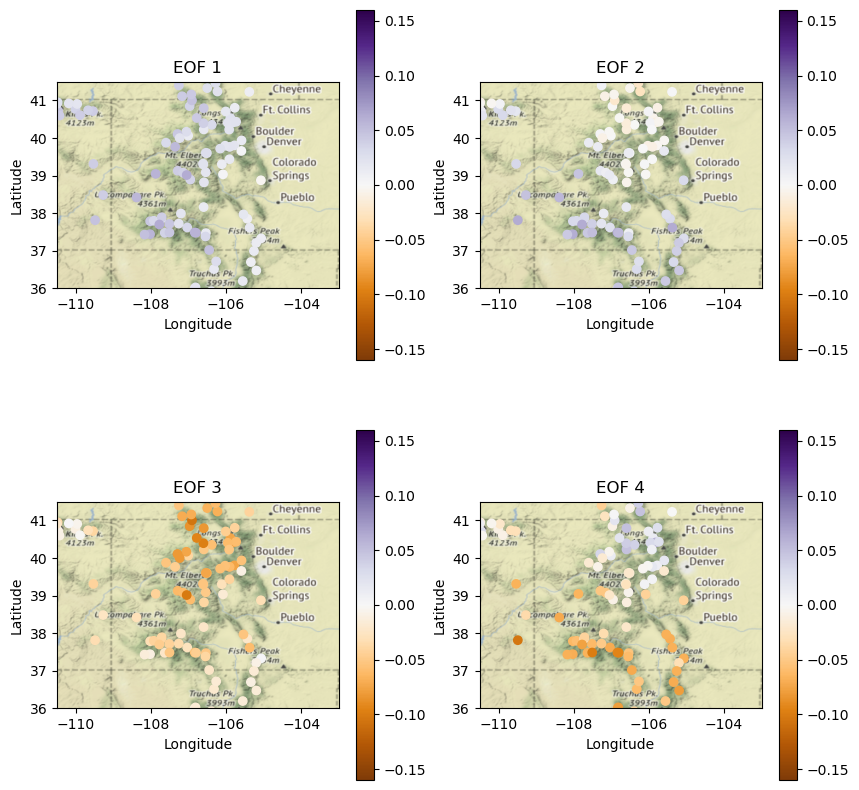

In [134]:
f, ax = plt.subplots(2,2,figsize=(10,10))
i = 0
for row in range(2):
    for column in range(2):     
        station_locations.plot(ax=ax[row,column], column=-1*Uc[:,i], legend=True, cmap='PuOr', vmin=-0.16, vmax=0.16)
        ctx.add_basemap(ax=ax[row,column], crs='epsg:4326', source=ctx.providers.Stamen.Terrain, attribution=False)
        ax[row,column].set_xlim(-110.5,-103)
        ax[row,column].set_ylim(36,41.5)
        ax[row,column].set_title('EOF {}'.format(i+1))
        ax[row,column].set_xlabel('Longitude')
        ax[row,column].set_ylabel('Latitude')
        i+=1

## Perform the K-means Clustering analysis:

Determine best parameters for:  
* init
* n_init
* cluster number

In [79]:
combined_anom_sdev_array.shape

(32, 511)

In [83]:
pearsons_cc = np.corrcoef(combined_anom_sdev_array.T)

In [84]:
pearsons_cc.shape

(511, 511)

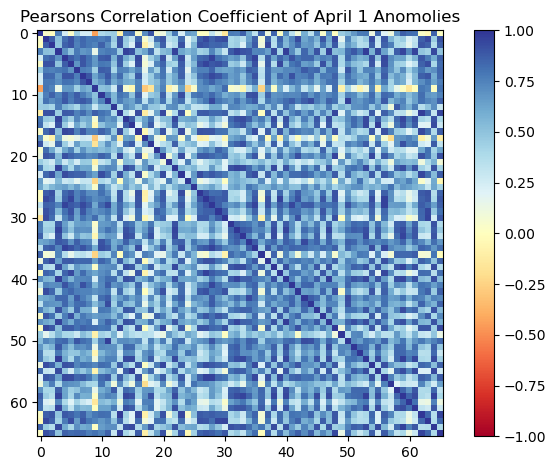

In [179]:
# code from https://www.kaggle.com/code/ignacioalorre/clustering-features-based-on-correlation-and-tags

plt.figure()
plt.imshow(pearsons_cc, interpolation='nearest', cmap ='RdYlBu', vmin=-1, vmax=1)
plt.colorbar()
plt.title('Pearsons Correlation Coefficient of April 1 Anomolies')
plt.tight_layout()

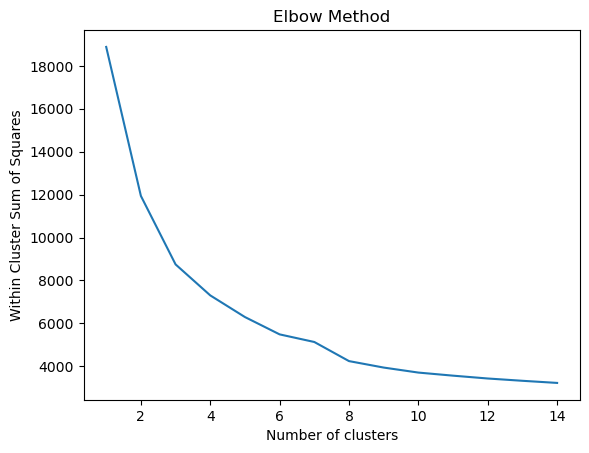

In [85]:
# code from https://www.kaggle.com/code/ignacioalorre/clustering-features-based-on-correlation-and-tags
# Determine optimun number of clusters for kmeans
wcss = []
max_num_clusters = 15
for i in range(1, max_num_clusters):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init='auto', random_state=0)
    kmeans.fit(pearsons_cc)
    wcss.append(kmeans.inertia_)
fig, ax = plt.subplots()    
plt.plot(range(1, max_num_clusters), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Within Cluster Sum of Squares')
plt.show()

## Interpretation:  
The elbow method doesn't seem very useful here - there's no elbow! 

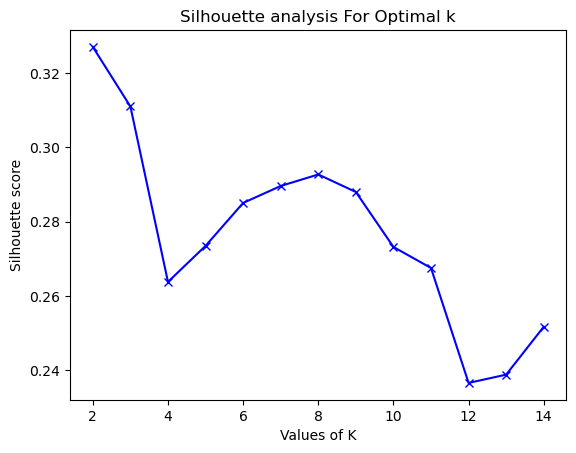

<Figure size 640x480 with 0 Axes>

In [86]:
# code from https://www.analyticsvidhya.com/blog/2021/05/k-mean-getting-the-optimal-number-of-clusters/
#import sklearn.metrics.silhouette_score as silhouette_score
range_n_clusters = [2, 3, 4, 5, 6, 7, 8,9,10,11,12,13,14]
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init=10)
    kmeans.fit(pearsons_cc)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg.append(sklearn.metrics.silhouette_score(pearsons_cc, cluster_labels))
plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()
plt.tight_layout()
#plt.savefig('../../../QualifyingExam/avg_silhouette.jpeg')

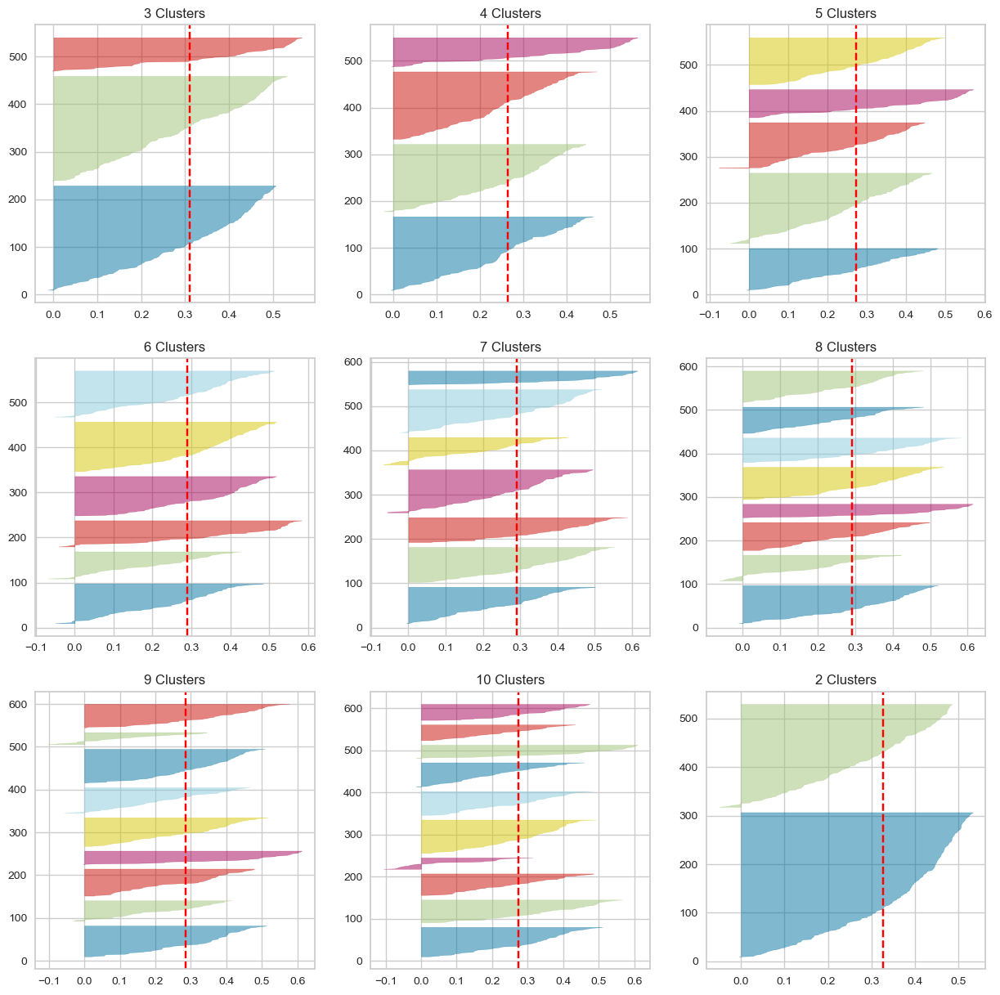

In [87]:
# need to install yellowbrick before running this

from yellowbrick.cluster import SilhouetteVisualizer
  
fig, ax = plt.subplots(3, 3, figsize=(15,15))
for i in [2, 3, 4, 5, 6, 7, 8, 9, 10]:
    '''
    Create KMeans instances for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 3)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(pearsons_cc) 
    ax[q-1][mod].set_title('{} Clusters'.format(i))

#plt.savefig('../../../QualifyingExam/silhouettevisualization.jpeg')

In [88]:
# Continued code from https://www.kaggle.com/code/ignacioalorre/clustering-features-based-on-correlation-and-tags

# Using kmeans to cluster the features based on their correlation
n_clusters_kmeans = 6
kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
pearsons_cc_labels = kmeans.fit_predict(pearsons_cc)
feat_names = combined_april1_anom_sdev.columns
# Preparing a dataframe to collect some cluster stats
pearsons_cc_clust_df = pd.DataFrame(np.c_[feat_names, pearsons_cc_labels])
pearsons_cc_clust_df.columns = ["feature", "cluster"]
pearsons_cc_clust_df['feat_list'] = pearsons_cc_clust_df.groupby(["cluster"]).transform(lambda x: ', '.join(x))
pearsons_cc_clust_df = pearsons_cc_clust_df.groupby(["cluster", "feat_list"]).size().reset_index(name = 'feat_count')
pearsons_cc_clust_df

,cluster,feat_list,feat_count
0,0,"302_OR_SNTL, 306_ID_SNTL, 312_ID_SNTL, 314_WY_...",90
1,1,"303_CO_SNTL, 308_AZ_SNTL, 310_AZ_SNTL, 316_NM_...",58
2,2,"304_OR_SNTL, 324_ID_SNTL, 331_OR_SNTL, 341_OR_...",78
3,3,"301_CA_SNTL, 327_CO_SNTL, 329_UT_SNTL, 330_UT_...",119
4,4,"315_MT_SNTL, 317_WY_SNTL, 322_CO_SNTL, 335_CO_...",60
5,5,"309_WY_SNTL, 311_MT_SNTL, 313_MT_SNTL, 323_ID_...",106


In [89]:
# Continued code from https://www.kaggle.com/code/ignacioalorre/clustering-features-based-on-correlation-and-tags

corr_node_dist = kmeans.transform(pearsons_cc)
corr_clust_dist = np.c_[feat_names, np.round(corr_node_dist.min(axis=1),3), np.round(corr_node_dist.min(axis=1)/np.max(corr_node_dist.min(axis=1)),3), pearsons_cc_labels]
corr_clust_dist_df = pd.DataFrame(corr_clust_dist)
corr_clust_dist_df.columns = ['feature', 'dist_corr', 'dist_corr_norm', 'cluster_corr']
corr_clust_dist_df

,feature,dist_corr,dist_corr_norm,cluster_corr
0,301_CA_SNTL,3.395,0.512,3
1,302_OR_SNTL,3.076,0.464,0
2,303_CO_SNTL,2.72,0.41,1
3,304_OR_SNTL,2.955,0.446,2
4,306_ID_SNTL,1.851,0.279,0
...,...,...,...,...
506,CRL,5.121,0.772,4
507,CSV,3.145,0.474,3
508,CAP,2.629,0.396,3
509,HHM,2.755,0.415,3


In [90]:
station_locations['cluster_corr'] = corr_clust_dist_df['cluster_corr'].values

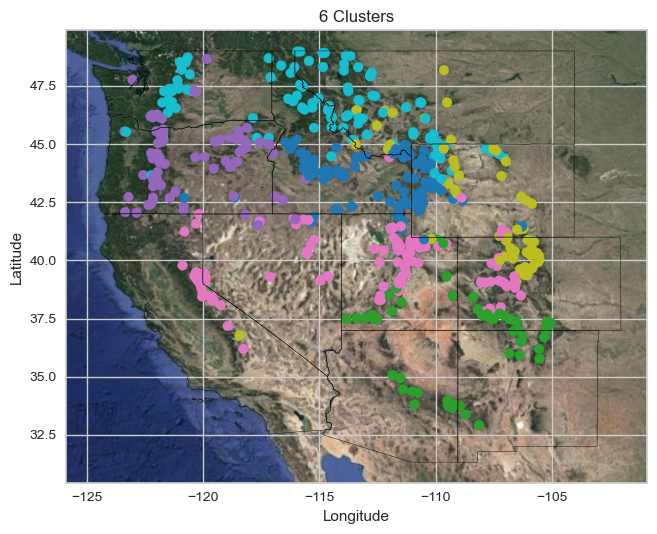

In [92]:
fig, ax = plt.subplots()

station_locations.plot(ax=ax, column='cluster_corr')
wstates.to_crs('epsg:4326').plot(ax=ax, facecolor='none')
ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}')
ax.set_title('6 Clusters')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.tight_layout()

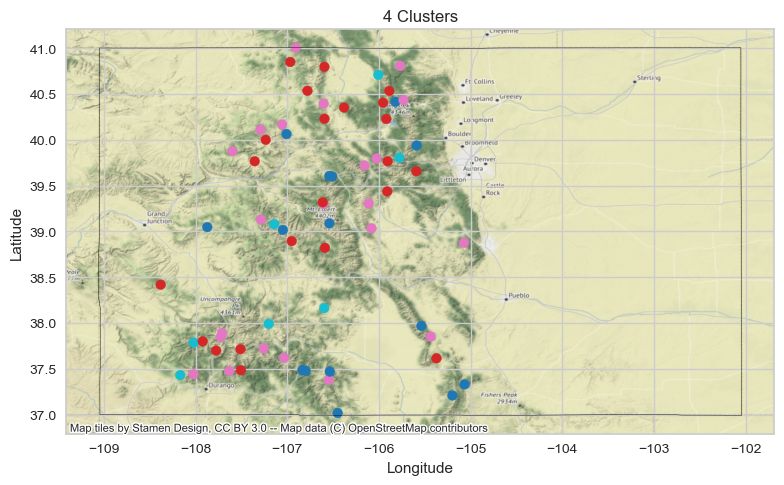

In [197]:
fig, ax = plt.subplots()

station_locations_co.plot(ax=ax, column='cluster_corr')
colorado.to_crs('epsg:4326').plot(ax=ax, facecolor='none')
ctx.add_basemap(ax=ax, crs='epsg:4326', source=ctx.providers.Stamen.Terrain)
ax.set_title('4 Clusters')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
#ax.set_xlim(-110.5,-102)
#ax.set_ylim(36,41.5)
plt.tight_layout()
#plt.savefig('../../../QualifyingExam/map_6clusters_CO.jpeg')

In [95]:
# Using kmeans to cluster the features based on their correlation
def cluster(n_clusters_kmeans, correlation_df):

    kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    pearsons_cc_labels = kmeans.fit_predict(correlation_df)
    feat_names = combined_april1_anom.columns
    # Preparing a dataframe to collect some cluster stats
    pearsons_cc_clust_df = pd.DataFrame(np.c_[feat_names, pearsons_cc_labels])
    pearsons_cc_clust_df.columns = ["feature", "cluster"]
    pearsons_cc_clust_df['feat_list'] = pearsons_cc_clust_df.groupby(["cluster"]).transform(lambda x: ', '.join(x))
    pearsons_cc_clust_df = pearsons_cc_clust_df.groupby(["cluster", "feat_list"]).size().reset_index(name = 'feat_count')

    corr_node_dist = kmeans.transform(correlation_df)
    corr_clust_dist = np.c_[feat_names, np.round(corr_node_dist.min(axis=1),3), np.round(corr_node_dist.min(axis=1)/np.max(corr_node_dist.min(axis=1)),3), pearsons_cc_labels]
    corr_clust_dist_df = pd.DataFrame(corr_clust_dist)
    corr_clust_dist_df.columns = ['feature', 'dist_corr', 'dist_corr_norm', 'cluster_corr']

    cluster_array = corr_clust_dist_df['cluster_corr'].values
    station_locations['cluster_corr'] = cluster_array
    
    fig, ax = plt.subplots()

    station_locations.plot(ax=ax, column='cluster_corr')
    ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}')
    wstates.to_crs('epsg:4326').plot(ax=ax, facecolor='none')
    ax.set_title('{} Clusters'.format(n_clusters_kmeans))
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    #plt.savefig('../../../QualifyingExam/spatial_dist_{}clusters.jpeg'.format(n_clusters_kmeans

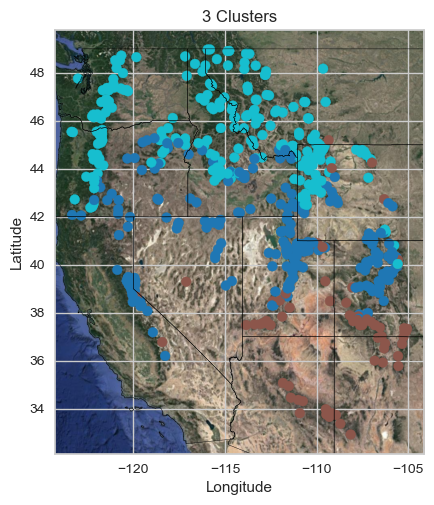

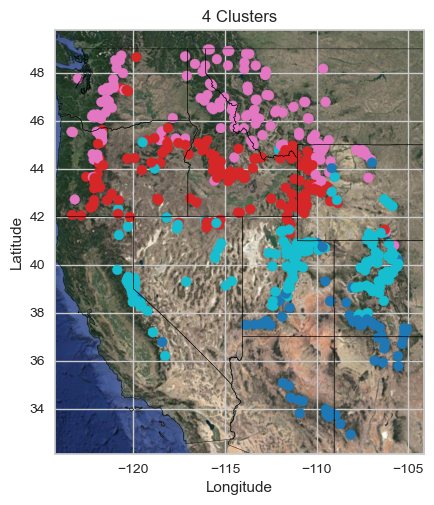

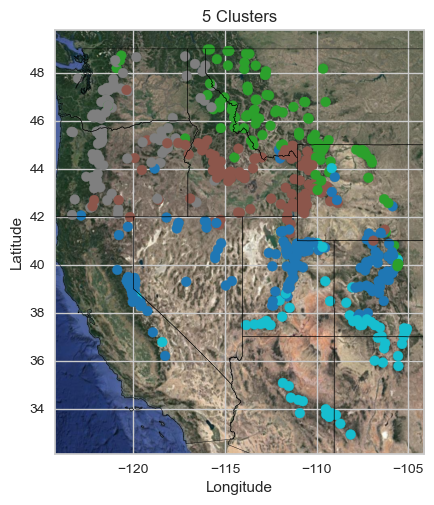

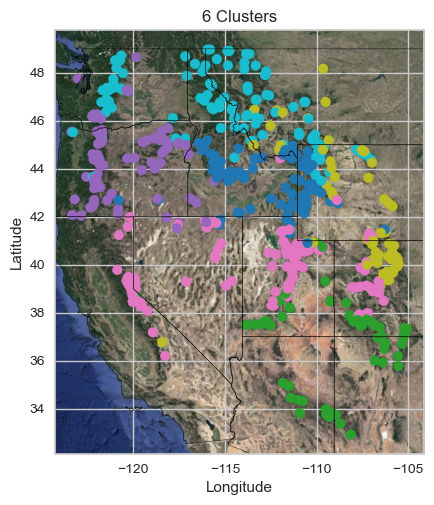

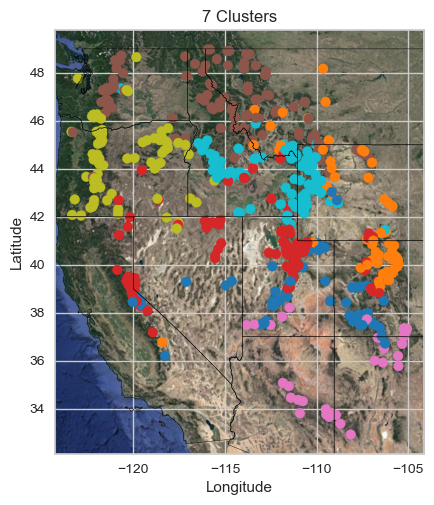

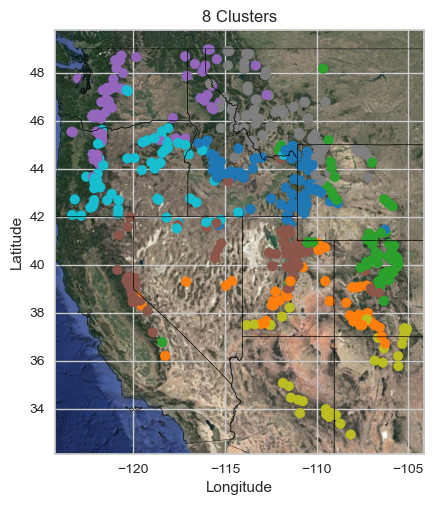

In [96]:
for i in range(3,9):
    cluster(i, pearsons_cc)